**Part a)** The first part is to split the data into three sets: training, validation, and test. Split each class separately so that there is an equal percentage of each class in all three sets. The number of total images in the validation is to be roughly 2000, in the test set 3000, and the remainder for the training set. It does not need to be exact. This is called a stratified split.

In [1]:
from pathlib import Path
import shutil
from sklearn.model_selection import train_test_split

import torch
from torch.utils.data import DataLoader, Dataset
from torchvision import datasets, transforms

import torch.nn as nn
import torchvision.models as models
from torchvision.models import ResNet18_Weights
import torch.optim as optim

from sklearn.metrics import accuracy_score, average_precision_score

import matplotlib.pyplot as plt
import pandas as pd

device = torch.device('mps')

First, we decide the classes. `.parts[-1]` gets out the last part in the directory, whilst `.iterdir()` iterates through directories, and `.is_dir()` sees to it, that it really is a directory.

In [2]:
dataset = Path('../2024/mandatory1_data/')

classes = [str(subdir.parts[-1]) for subdir in dataset.iterdir() if subdir.is_dir()]
classes

['forest', 'buildings', 'glacier', 'street', 'mountain', 'sea']

Then, we create directories for `train, val, test` in the root folder

In [3]:
base_path = Path('../2024/')

# the directories we want to create
dirs = ['train', 'val', 'test']

for dir_name in dirs_names:
    # creating a path string
    dir_path = base_path / dir_name
    dir_path.mkdir(parents=True, exist_ok=True) # creating directory

    # creating subdirectories of class names
    for class_name in class_names:
        class_path = base_path / dir_name / class_name
        class_path.mkdir(parents=True, exist_ok=True)

Now we need to split the data into train, test, vals. A good way of doing this is to use `train_test_split` of the filenames and classes, and then fill our folders up.

In [4]:
img_paths = [] # container for image paths
class_indices = [] # container for class indices

for class_index, class_name in enumerate(classes):
    class_path = dataset / class_name
    for img_file in class_path.iterdir():
        if img_file.is_file():
            img_paths.append(img_file)
            class_indices.append(class_index)

In [5]:
train_imgs, temp_imgs, train_indices, temp_indices = train_test_split(
    img_paths, class_indices, test_size=0.3, stratify=class_indices, random_state=42
)

In [6]:
val_imgs, test_imgs, val_indices, test_indices = train_test_split(
    temp_imgs, temp_indices, test_size=0.6, stratify=temp_indices, random_state=42
)

In [7]:
def copy_images(img_paths, class_indices, split_name):
    
    for img_path, class_index in zip(img_paths, class_indices):
        target_dir = base_path / split_name / classes[class_index]
        target_file = target_dir / img_path.name

        # copying the file if it's not already there
        if not target_file.exists():
            shutil.copy(img_path, target_file)

In [8]:
copy_images(train_imgs, train_indices, 'train')
copy_images(val_imgs, val_indices, 'val')
copy_images(test_imgs, test_indices, 'test')

We now have folders with the data. Finally we can do a check for duplicates.

In [9]:
def verify_no_duplicates(train_imgs, val_imgs, test_imgs):
    train_set = set(train_imgs)
    val_set = set(val_imgs)
    test_set = set(test_imgs)

    # using intersection to check for data overlaps
    assert len(train_set.intersection(val_set)) == 0, 'Overlap between Train and Val'
    assert len(train_set.intersection(test_set)) == 0, 'Overlap between Train and Test'
    assert len(val_set.intersection(test_set)) == 0, 'Overlap between Val and Test'

verify_no_duplicates(train_imgs, val_imgs, test_imgs)

**Part b)** Write code for the training, validation, and test dataloaders. Please make one root path for the dataset, this makes it easier for us to check/debug your work. If there are multiple paths to the dataset we need to change, it becomes tricky to change them all.

In [10]:
transform = transforms.Compose([
    transforms.Resize((150, 150)),
    transforms.ToTensor(), # converts to a torch tensor
    transforms.Normalize((0.5,), (0.5,)) # normalizes to [-1, 1]
])

In [11]:
train_dataset = datasets.ImageFolder(root=base_path / 'train', transform=transform)
val_dataset = datasets.ImageFolder(root=base_path / 'val', transform=transform)
test_dataset = datasets.ImageFolder(root=base_path / 'test', transform=transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

**Part c)** Choose a model for training. A ResNet type model is fine, but the choice is yours. We will be finetuning the model, not training from scratch. Also choose an appropriate loss function for the multi-class classification task.

In [12]:
model = models.resnet18(weights=ResNet18_Weights.DEFAULT) # already trained model

# optimizing the output layer to our amount of classes (6)
num_classes = len(classes)
model.fc = nn.Linear(model.fc.in_features, num_classes)

# setting loss function for this type of classification problem
criterion = nn.CrossEntropyLoss()

# setting optimizer
optimizer = optim.Adam(model.parameters(), lr=0.001)

In [15]:
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
model = model.to(device)

def train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs=10):
    model.train()

    for epoch in range(num_epochs):
        running_loss = 0.0
        correct = 0
        total = 0

        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()

            outputs = model(images)
            loss = criterion(outputs, labels)

            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            _, preds = torch.max(outputs, 1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

        train_accuracy = correct / total
        val_accuracy, _, _ = evaluate_model(model, val_loader)

        print(f"Epoch {epoch+1}/{num_epochs}, Loss: {running_loss:.4f}, Train Accuracy: {train_accuracy:.4f}, Val Accuracy: {val_accuracy:.4f}")

train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs=10)

Epoch 1/10, Loss: 130.2814, Train Accuracy: 0.8801, Val Accuracy: 0.8615
Epoch 2/10, Loss: 498.1251, Train Accuracy: 0.4460, Val Accuracy: 0.5470
Epoch 3/10, Loss: 316.4744, Train Accuracy: 0.6628, Val Accuracy: 0.7295
Epoch 4/10, Loss: 239.9190, Train Accuracy: 0.7575, Val Accuracy: 0.7975
Epoch 5/10, Loss: 194.4012, Train Accuracy: 0.8103, Val Accuracy: 0.8253
Epoch 6/10, Loss: 174.3745, Train Accuracy: 0.8334, Val Accuracy: 0.8214
Epoch 7/10, Loss: 156.5187, Train Accuracy: 0.8524, Val Accuracy: 0.8381
Epoch 8/10, Loss: 145.8348, Train Accuracy: 0.8614, Val Accuracy: 0.8249
Epoch 9/10, Loss: 129.8729, Train Accuracy: 0.8793, Val Accuracy: 0.8576
Epoch 10/10, Loss: 118.5616, Train Accuracy: 0.8926, Val Accuracy: 0.8562


**Part d)** Write code to calculate the **accuracy per class** (how many of the images in each class were correctly classified) and the **average precision (AP)** per class. It’s not necessary to report this for the training, just validation and testing. Also report the accuracy and average precision averaged over all the classes, for the latter this is called the **mean average precision (mAP)**.
When you compute the AP for a class, you will need to modify the label so that it is 1 if the image is labelled with the class of interest, and 0 otherwise (from another class).

In [16]:
def evaluate_model(model, dataloader):
    
    model.eval() # model into evaluation mode
    
    all_preds = []
    all_labels = []
    all_probs = []

    with torch.no_grad():
        for images, labels in dataloader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)

            probs = torch.softmax(outputs, dim=1)
            _, preds = torch.max(outputs, 1)

            all_preds.append(preds.cpu())
            all_labels.append(labels.cpu())
            all_probs.append(probs.cpu())

    all_preds = torch.cat(all_preds)
    all_labels = torch.cat(all_labels)
    all_probs = torch.cat(all_probs)

    accuracy = accuracy_score(all_labels, all_preds)

    ap_scores = []
    for i in range(all_probs.shape[1]):
        binary_labels = (all_labels == i).float()
        
        ap = average_precision_score(
            binary_labels.cpu().numpy(), 
            all_probs[:, i].cpu().numpy()
        )
        ap_scores.append(ap)

    map_score = sum(ap_scores) / len(ap_scores)

    return accuracy, ap_scores, map_score

**Part e)** Training your model. Your Python code should be able to be run without extra parameters on the command line, just python `my_code.py`.
Train your model with three different hyperparameter settings. The hyperparameter could be the learning rate, optimizer, data augmentation parameters, or others.​

In [17]:
def train_model_with_hyperparams(model, train_loader, val_loader, criterion, optimizer, lr, num_epochs=15):
    model = model.to(device)
    optimizer = optimizer(model.parameters(), lr=lr)

    train_accs = []
    val_accs = []

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0

        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            _, preds = torch.max(outputs, 1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

        train_accuracy = correct / total
        val_accuracy, _, _ = evaluate_model(model, val_loader)

        train_accs.append(train_accuracy)
        val_accs.append(val_accuracy)

        print(f"Epoch {epoch+1}/{num_epochs}, Train Accuracy: {train_accuracy:.4f}, Val Accuracy: {val_accuracy:.4f}")

    return train_accs, val_accs
    

In [18]:
train_acc1, val_acc1 = train_model_with_hyperparams(model, train_loader, val_loader, criterion, optim.Adam, 0.001)
train_acc2, val_acc2 = train_model_with_hyperparams(model, train_loader, val_loader, criterion, optim.SGD, 0.0005)
train_acc3, val_acc3 = train_model_with_hyperparams(model, train_loader, val_loader, criterion, optim.Adam, 0.0001)

Epoch 1/15, Train Accuracy: 0.8597, Val Accuracy: 0.8757
Epoch 2/15, Train Accuracy: 0.9007, Val Accuracy: 0.8777
Epoch 3/15, Train Accuracy: 0.9186, Val Accuracy: 0.8811
Epoch 4/15, Train Accuracy: 0.9271, Val Accuracy: 0.8929
Epoch 5/15, Train Accuracy: 0.9465, Val Accuracy: 0.8885
Epoch 6/15, Train Accuracy: 0.9595, Val Accuracy: 0.8850
Epoch 7/15, Train Accuracy: 0.9631, Val Accuracy: 0.8596
Epoch 8/15, Train Accuracy: 0.9702, Val Accuracy: 0.8806
Epoch 9/15, Train Accuracy: 0.9732, Val Accuracy: 0.9002
Epoch 10/15, Train Accuracy: 0.9737, Val Accuracy: 0.8762
Epoch 11/15, Train Accuracy: 0.9805, Val Accuracy: 0.8929
Epoch 12/15, Train Accuracy: 0.9891, Val Accuracy: 0.8933
Epoch 13/15, Train Accuracy: 0.9836, Val Accuracy: 0.8845
Epoch 14/15, Train Accuracy: 0.9844, Val Accuracy: 0.8860
Epoch 15/15, Train Accuracy: 0.9846, Val Accuracy: 0.8733
Epoch 1/15, Train Accuracy: 0.9834, Val Accuracy: 0.8826
Epoch 2/15, Train Accuracy: 0.9873, Val Accuracy: 0.8826
Epoch 3/15, Train Accurac

In [19]:
val_accuracy, val_ap_scores, val_map_score = evaluate_model(model, val_loader)
test_accuracy, test_ap_scores, test_map_score = evaluate_model(model, test_loader)

print(f"Accuracies in this model: Val: {val_accuracy:.4f} Test: {test_accuracy:.4f}")
print(f"AP per class in this model: \nVal: {val_ap_scores} \nTest: {test_ap_scores}")
print(f"mAP: Val: {val_map_score:.4f} Test: {test_map_score:.4f}")

Accuracies in this model: Val: 0.9017 Test: 0.9087
AP per class in this model: 
Val: [0.9656725203257859, 0.9938081107812009, 0.8980481702510463, 0.9145754574303576, 0.9838805327297234, 0.965612989462708] 
Test: [0.9632368299761579, 0.9974538188747879, 0.9152007689243503, 0.9319566948885799, 0.9802704504103491, 0.9678002549602504]
mAP: Val: 0.9536 Test: 0.9593


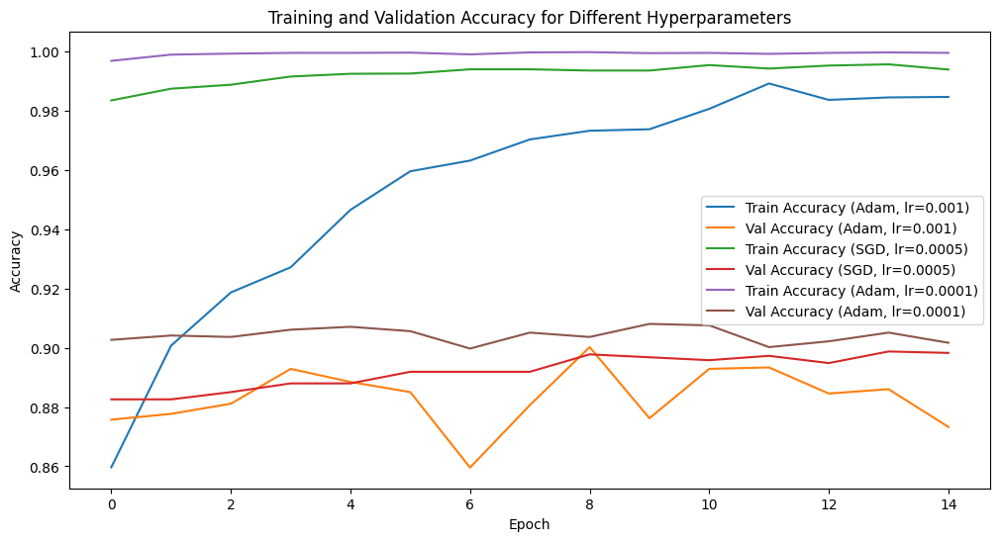

In [20]:
# Plot trenings- og valideringsnøyaktighet
plt.figure(figsize=(12, 6))
plt.plot(train_acc1, label='Train Accuracy (Adam, lr=0.001)')
plt.plot(val_acc1, label='Val Accuracy (Adam, lr=0.001)')
plt.plot(train_acc2, label='Train Accuracy (SGD, lr=0.0005)')
plt.plot(val_acc2, label='Val Accuracy (SGD, lr=0.0005)')
plt.plot(train_acc3, label='Train Accuracy (Adam, lr=0.0001)')
plt.plot(val_acc3, label='Val Accuracy (Adam, lr=0.0001)')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy for Different Hyperparameters')
plt.legend()
plt.show()


**Part f)** Discuss your findings. How does your model perform? Does it perform better on certain classes? Why do you think that is? Also, discuss the differences between the hyperparameter settings and their impact on the results.​

In [21]:
def save_softmax_scores(model, dataloader, device, output_file="softmax_scores.csv"):
    model.eval()
    all_probs = []
    all_labels = []

    with torch.no_grad():
        for images, labels in dataloader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)
            all_probs.extend(probs.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    df = pd.DataFrame(all_probs)
    df['label'] = all_labels
    df.to_csv(output_file, index=False)

# Kall funksjonen for å lagre softmax-scorene
save_softmax_scores(model, test_loader, device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Beste bilder for klasse 0


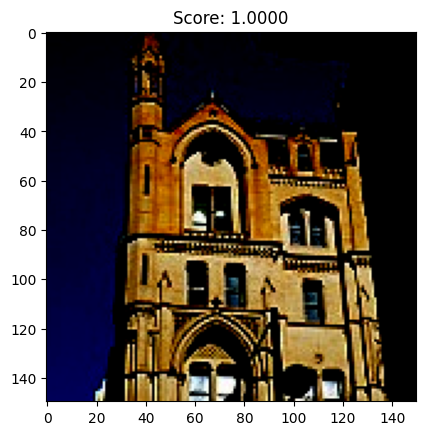

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


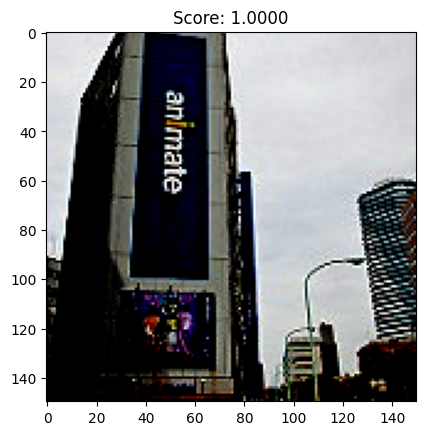

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


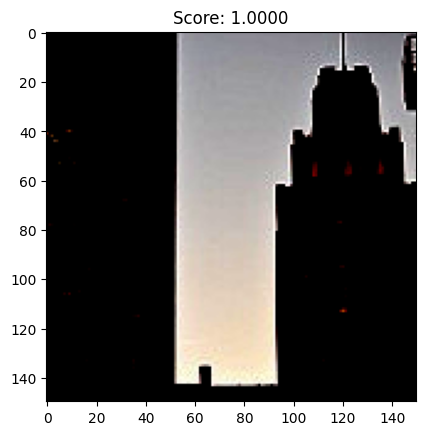

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


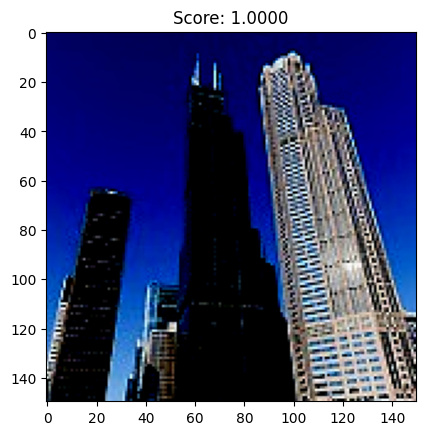

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


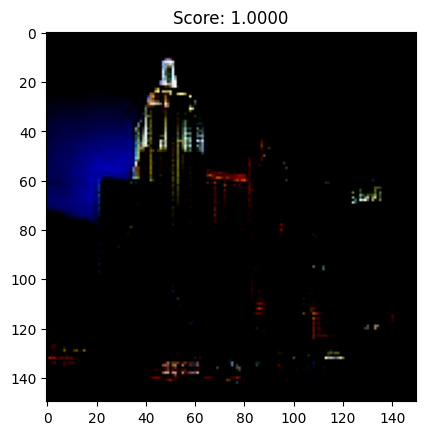

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


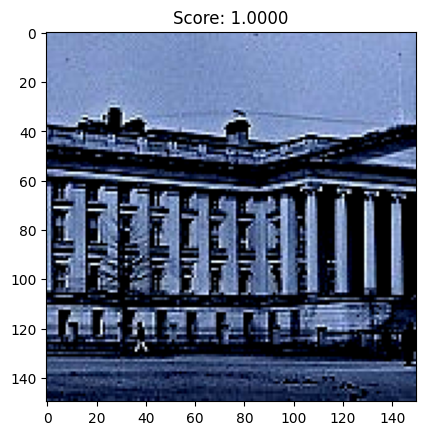

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


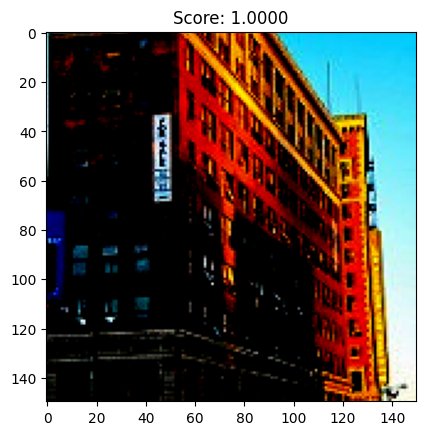

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


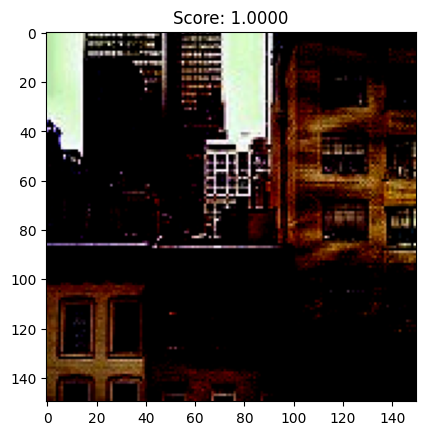

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


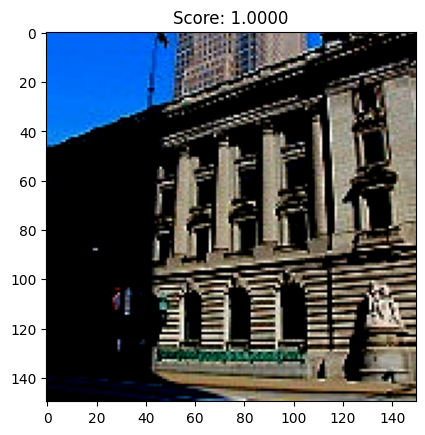

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


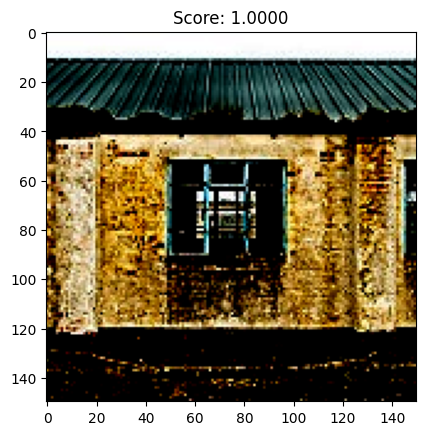

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Verste bilder for klasse 0


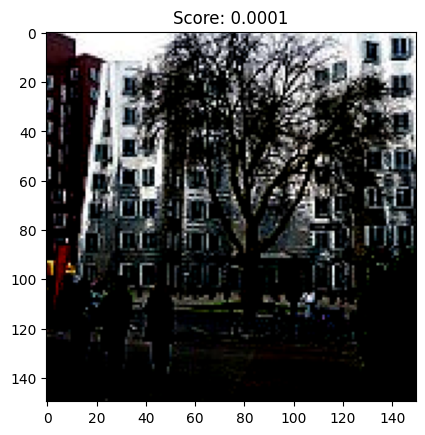

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


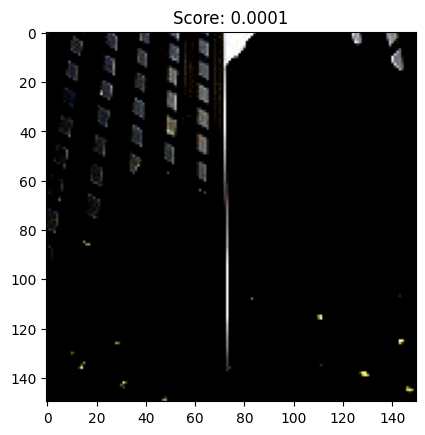

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


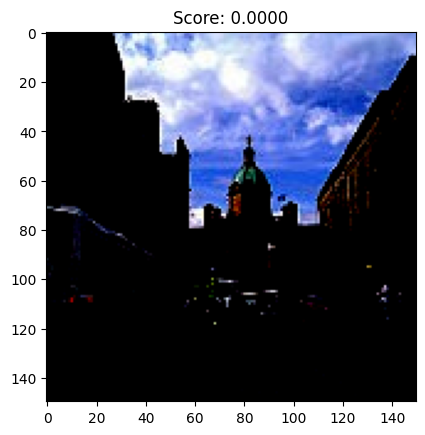

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


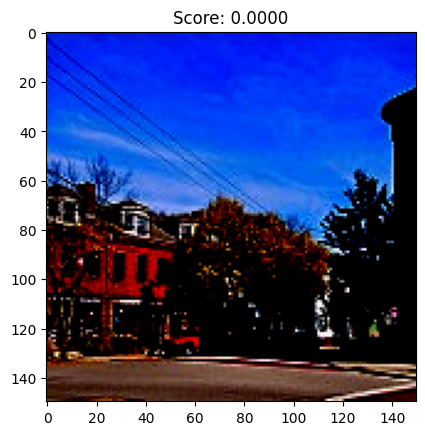

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


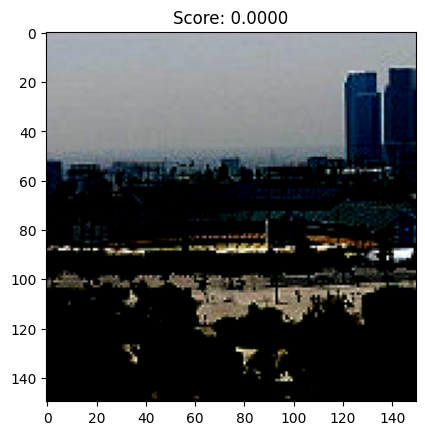

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


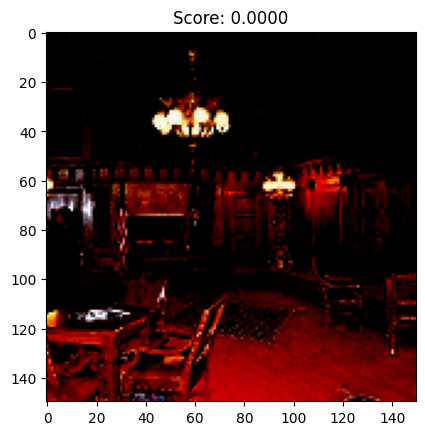

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


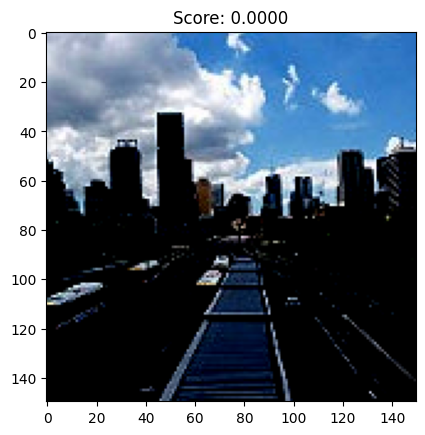

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


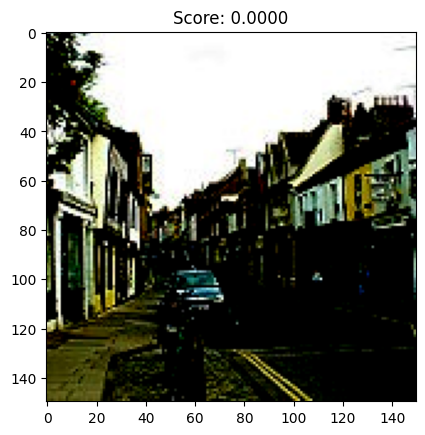

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


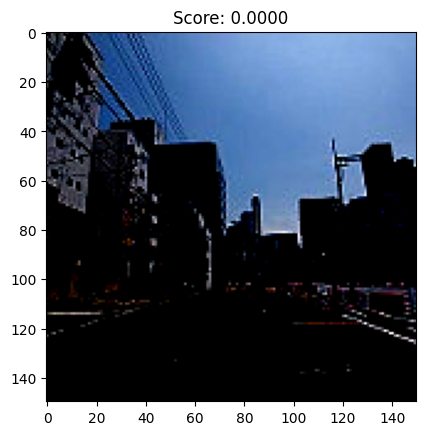

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


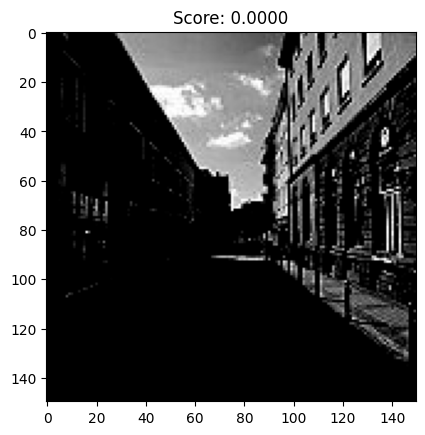

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Beste bilder for klasse 1


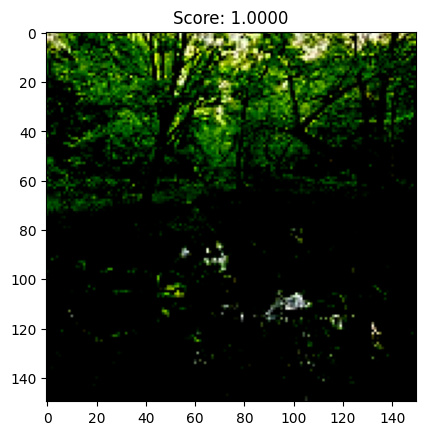

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


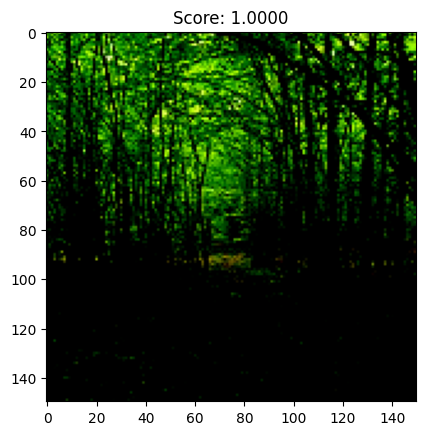

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


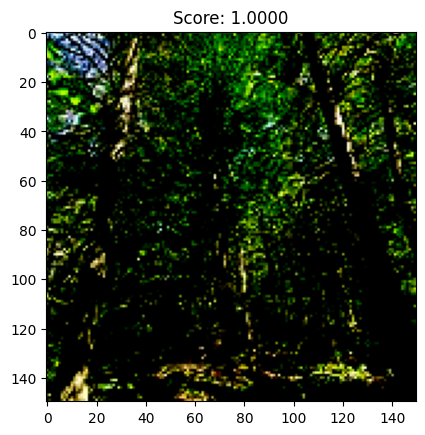

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


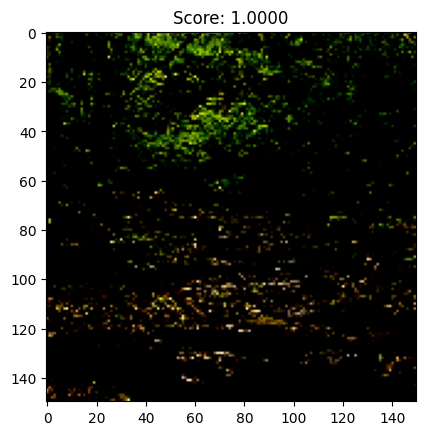

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


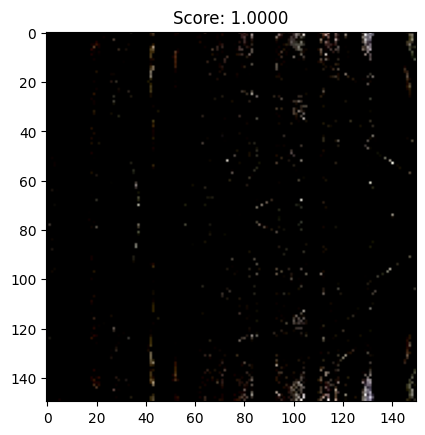

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


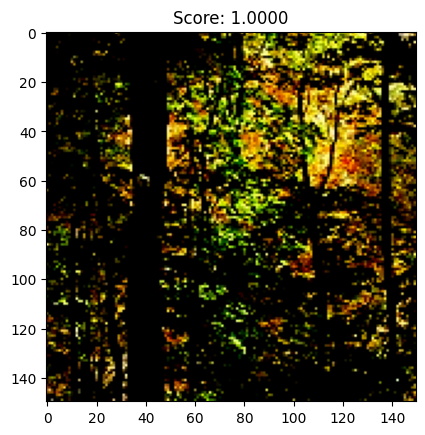

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


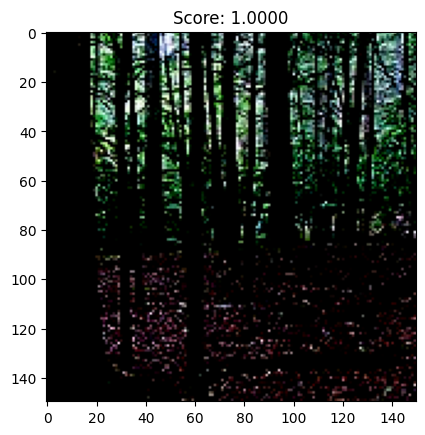

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


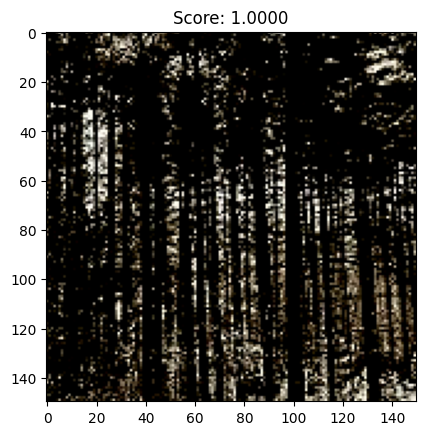

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


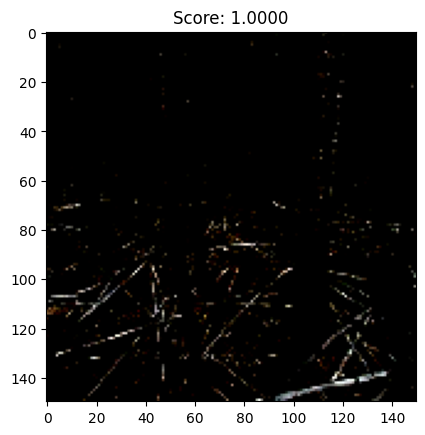

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


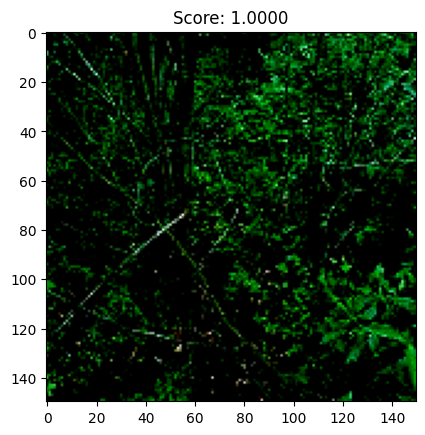

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Verste bilder for klasse 1


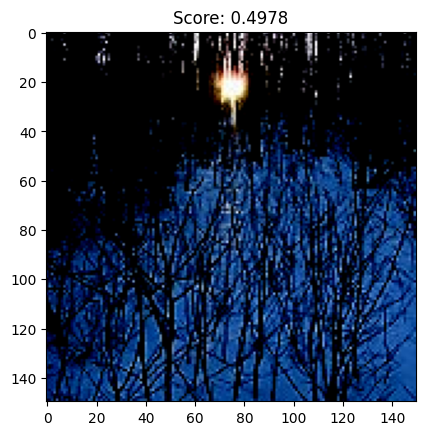

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.7176471].


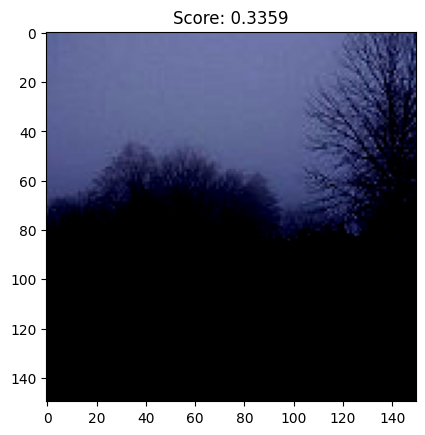

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


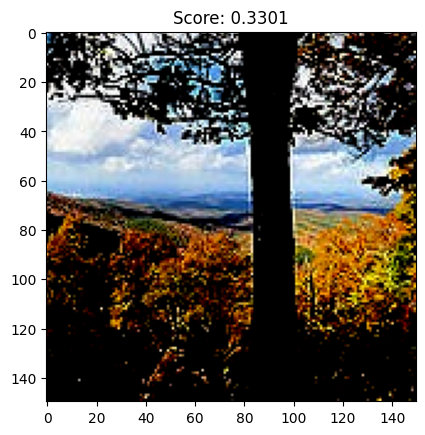

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


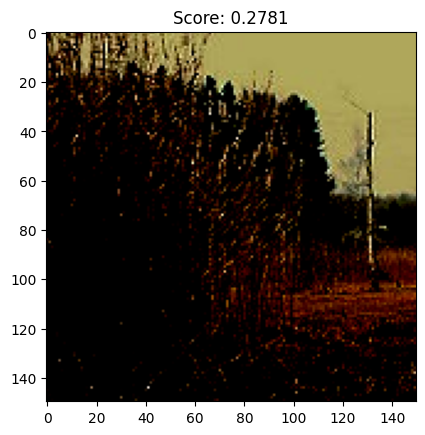

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


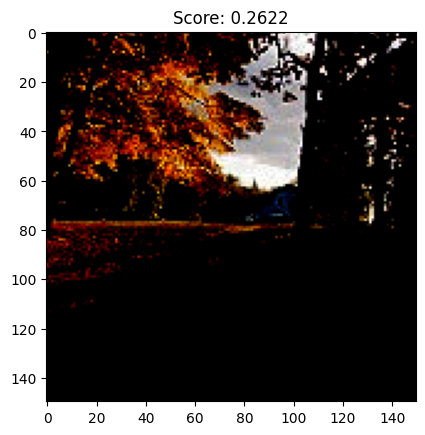

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


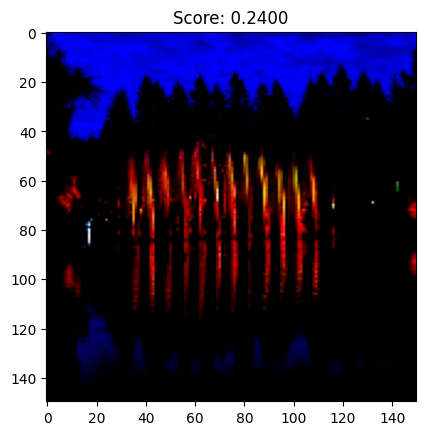

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


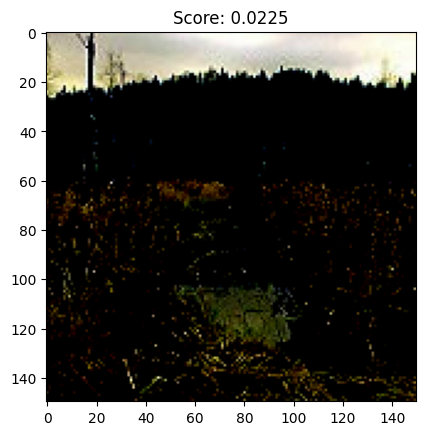

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


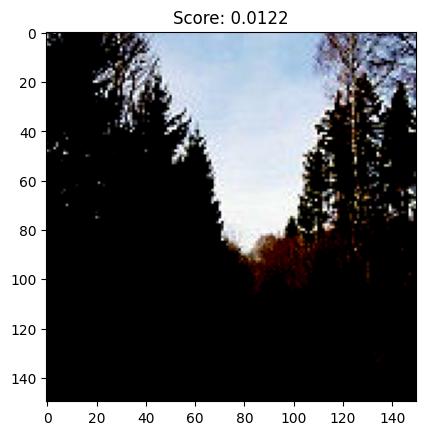

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


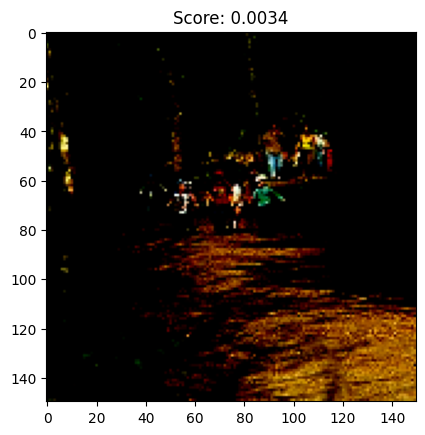

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


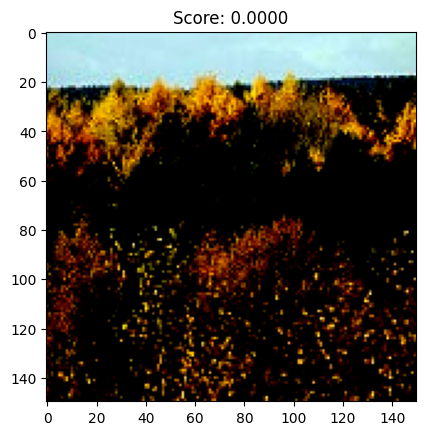

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Beste bilder for klasse 2


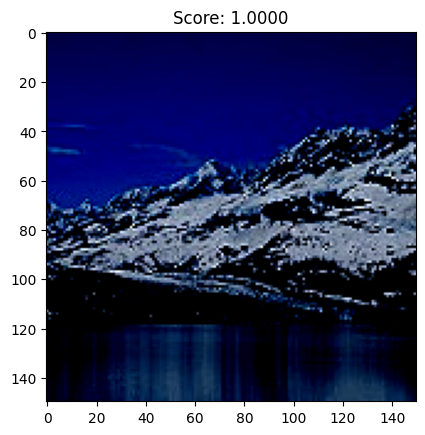

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


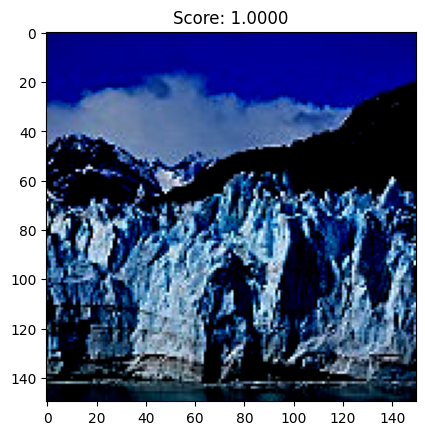

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


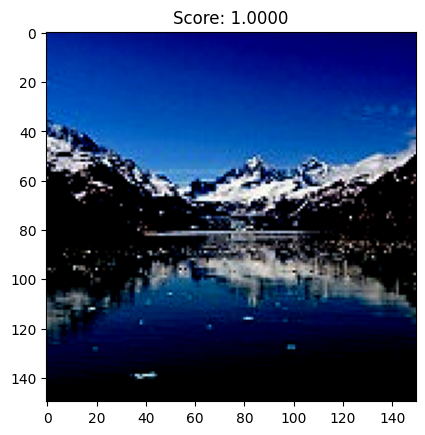

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


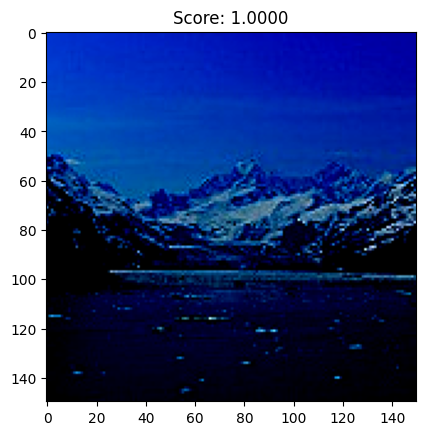

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


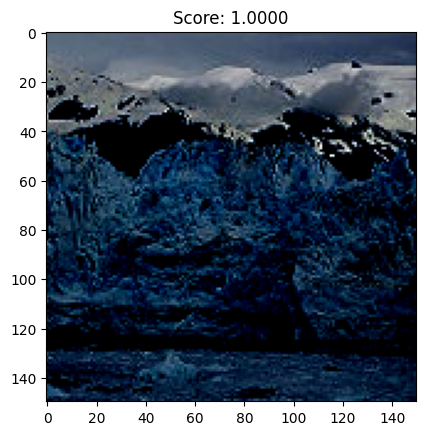

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


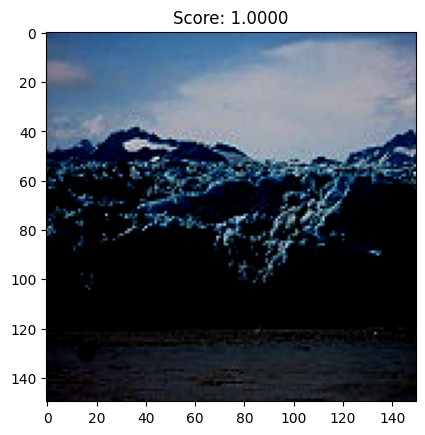

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.8352941].


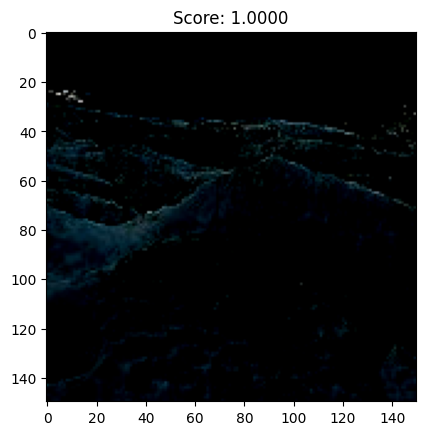

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


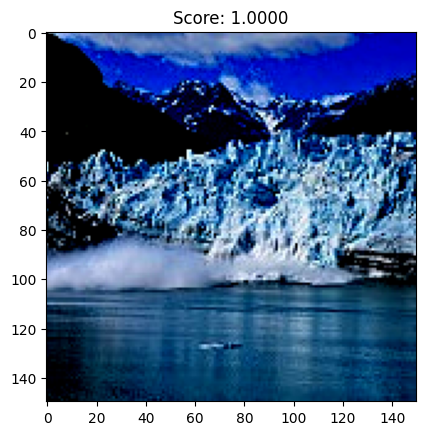

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


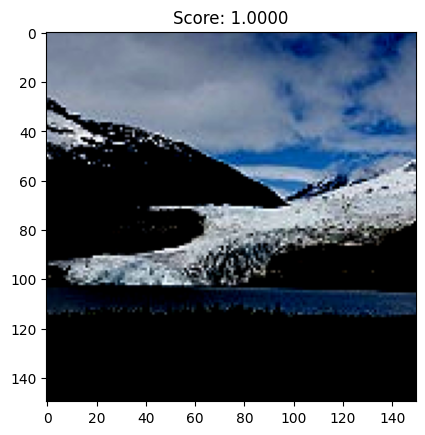

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


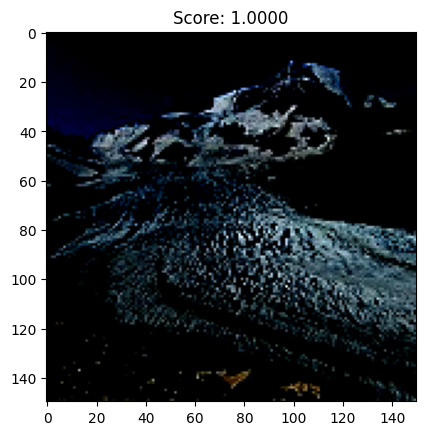

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


Verste bilder for klasse 2


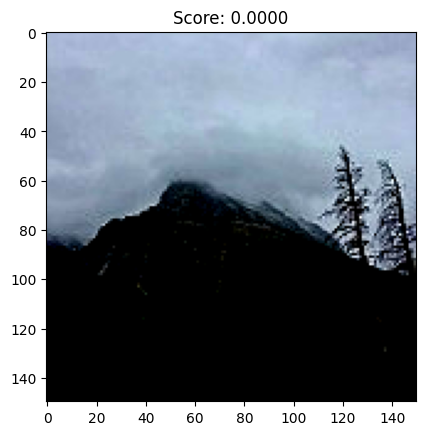

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


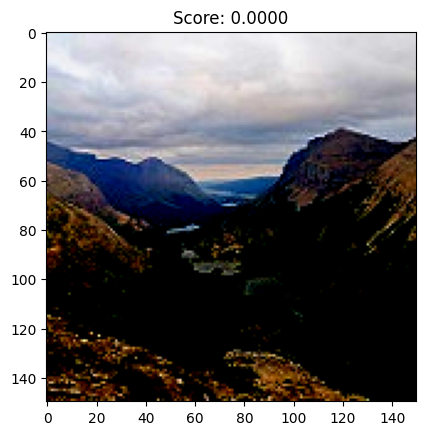

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


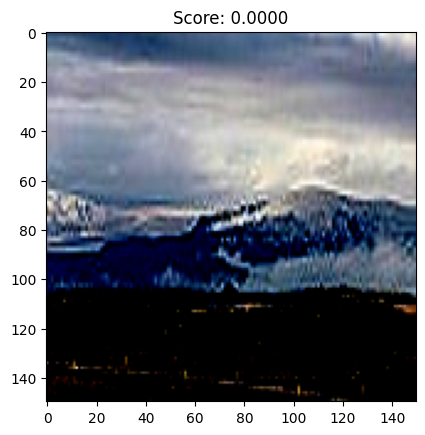

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


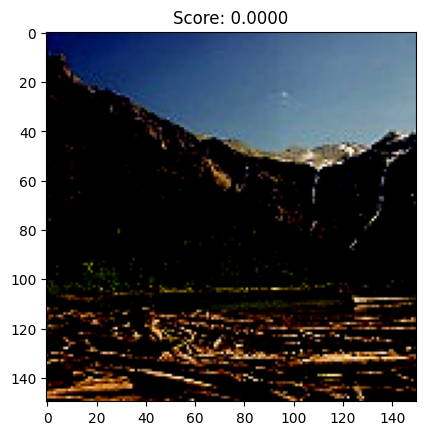

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


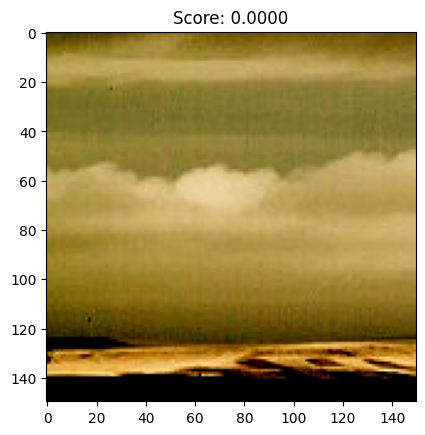

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


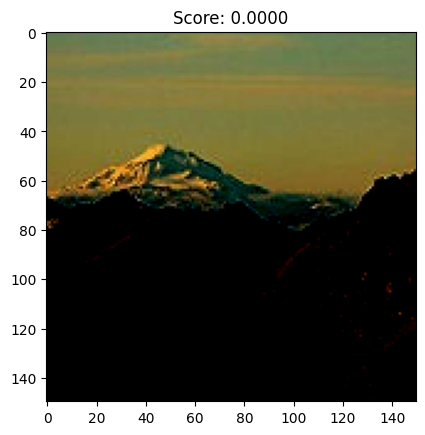

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.827451].


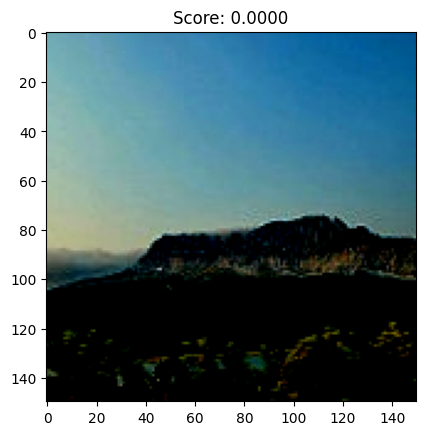

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


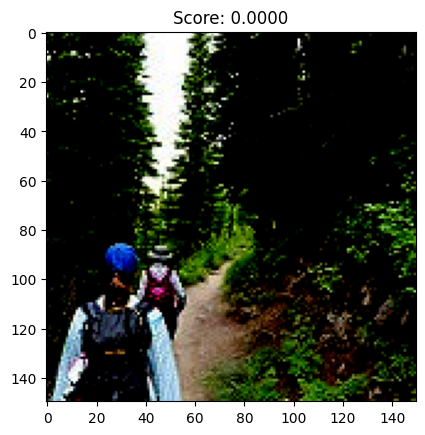

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


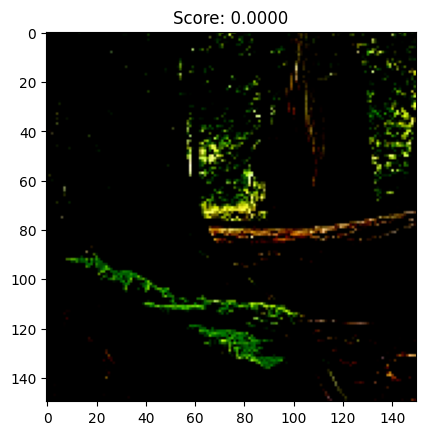

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


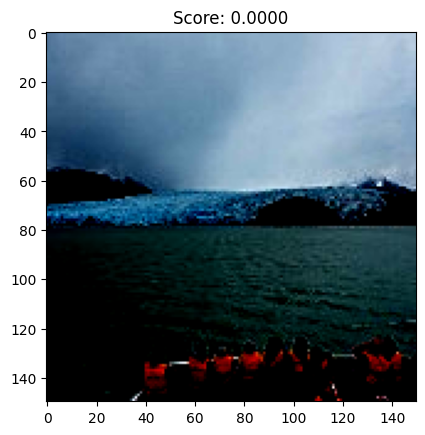

In [22]:
import matplotlib.pyplot as plt

def show_best_and_worst_images(model, dataloader, class_idx, num_images=10):
    model.eval()
    images_scores = []

    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)
            scores = probs[:, class_idx].cpu().numpy()

            for img, score, label in zip(images.cpu(), scores, labels):
                if label == class_idx:
                    images_scores.append((img, score))

    # Sorter bildene basert på score
    images_scores.sort(key=lambda x: x[1], reverse=True)

    # Vis de beste bildene
    print(f"Beste bilder for klasse {class_idx}")
    for i in range(num_images):
        plt.imshow(images_scores[i][0].permute(1, 2, 0))
        plt.title(f"Score: {images_scores[i][1]:.4f}")
        plt.show()

    # Vis de verste bildene
    print(f"Verste bilder for klasse {class_idx}")
    for i in range(-num_images, 0):
        plt.imshow(images_scores[i][0].permute(1, 2, 0))
        plt.title(f"Score: {images_scores[i][1]:.4f}")
        plt.show()

# Kjør funksjonen for tre klasser (for eksempel klasse 0, 1, 2)
show_best_and_worst_images(model, test_loader, class_idx=0)
show_best_and_worst_images(model, test_loader, class_idx=1)
show_best_and_worst_images(model, test_loader, class_idx=2)